# Music classification using Keras

# What is Sound?

The sound is represented in an audio signal. It is as a level of electrical voltage for analog signals, and a series of binary number for digital signals.

Audio signals have frequencies in the audio frequency range of roughly 20 to 20,000 Hz, which corresponds to the upper and lower limits of human hearing.

# List of format for a sound file:

WMA - Windows Media Audio,

WAV - Waveform Audio,

MIDI - Music Instrument Digital Interface,

AAC - Advanced Audio Coding,

Ogg Vorbis - A free, open and un-patented music format,

ADPCM - Adaptive Differential Pulse Code Modulation,

ASF - Advanced Streaming Format,

VQF - Vector Quantization Format,

ATRAC - Sony's Adaptive Transform Acoustic Coding 3.


# LIBROSA

Librosa is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

# Exploring Audio Files

In [0]:
import librosa
audio_path ='disco.00018.au'
x , sr = librosa.load(audio_path)
print(type(x), type(sr))
print(x.shape, sr)


<class 'numpy.ndarray'> <class 'int'>
(661794,) 22050


It returns two values in which one an audio time series as a numpy array and another value is a default sampling rate(sr) of 22KHZ mono.

What is the sampling rate?

The sample rate is the number of samples of audio carried per second, measured in Hz or kHz

# Playing Audio

In [2]:
import IPython.display as ipd
ipd.Audio('MoodyLoop.wav')

# Visualizing Audio

Waveform

A waveform is an image that represents an audio signal or recording. It shows the changes in amplitude over a certain amount of time.

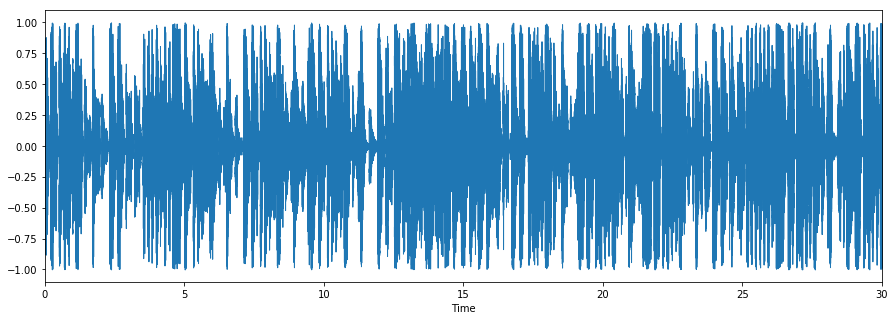

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

#load audio file
audio_path ='hiphop.00006.au'
x , sr = librosa.load(audio_path)

#figure size
plt.figure(figsize=(15, 5))

#show time series value as a wave
librosa.display.waveplot(x, sr=sr)

# Spectrogram

A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonography, voiceprints, or voicegrams. When the data is represented in a 3D plot they may be called waterfalls.

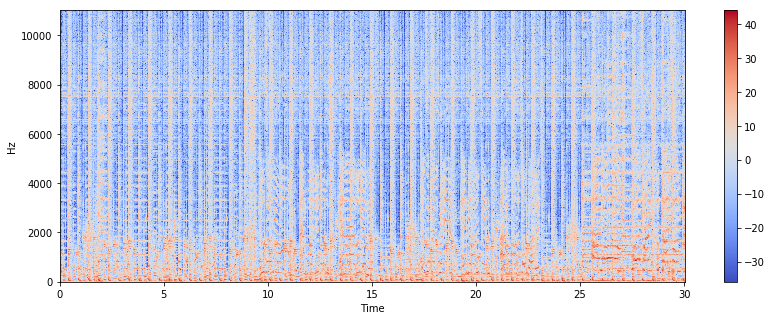

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

#load audio file
audio_path ='disco.00018.au'
x , sr = librosa.load(audio_path)

#calculate spectrogram value
X = librosa.stft(x)

#convert amplitude value to absolute value
Xdb = librosa.amplitude_to_db(abs(X))

#figure size
plt.figure(figsize=(14, 5))

#show spectrogram value
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

#show colorbar
plt.colorbar()

# zero-crossing rate


The zero-crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to zero to negative or from negative to zero to positive.

This feature has been used heavily in both speech recognition and music information retrieval,
being a key feature to classify percussive sounds like those in metal and rock.


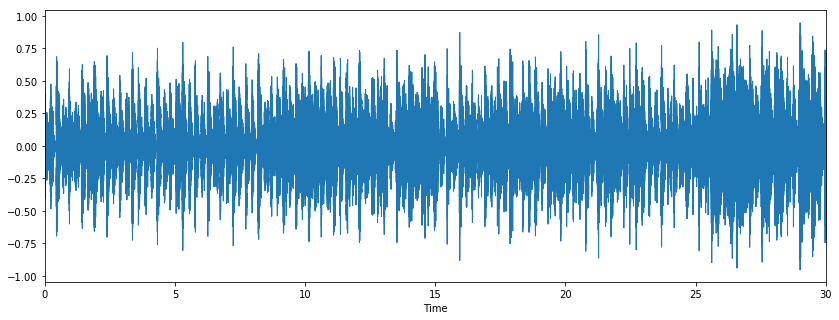

In [0]:
# Load the signal
x, sr = librosa.load('disco.00018.au')
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

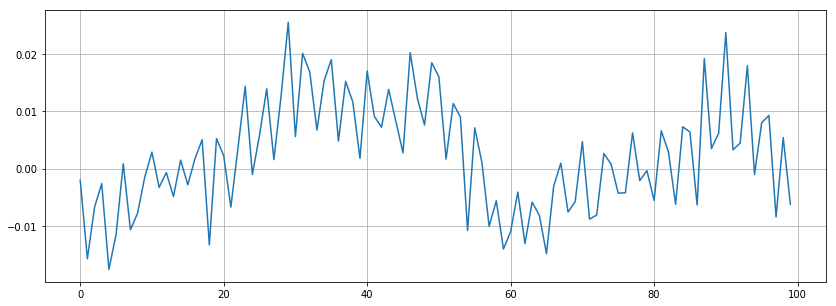

In [0]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [0]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

34


# Spectral Centroid

The spectral centroid is a measure used in digital signal processing to characterize a spectrum. It indicates where the "center of mass" of the spectrum is located. Perceptually, it has a robust connection with the impression of "brightness" of a sound.

(1293,)


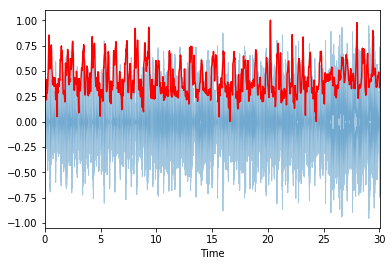

In [0]:
import sklearn.preprocessing
# find spectral centroid a disco music using spectral_centroid method
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(spectral_centroids.shape)

# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

Here, spectral centroids value are in red color in above plot.

# Spectral Rolloff

It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy

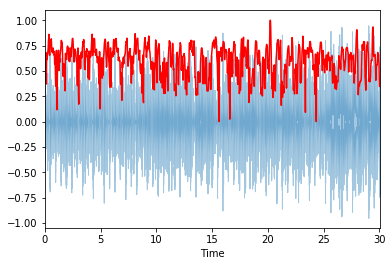

In [0]:
# call spectral rolloff method 
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')


# Mel-frequency cepstrum(MFCCs)

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

(20, 1293)


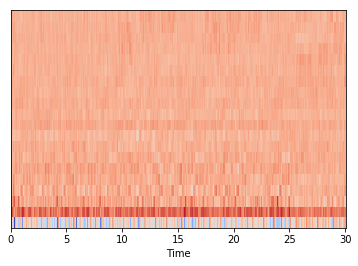

In [0]:
# Load the signal
x, sr = librosa.load('disco.00018.au')

#find mfcc value
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# Chroma Frequencies

Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

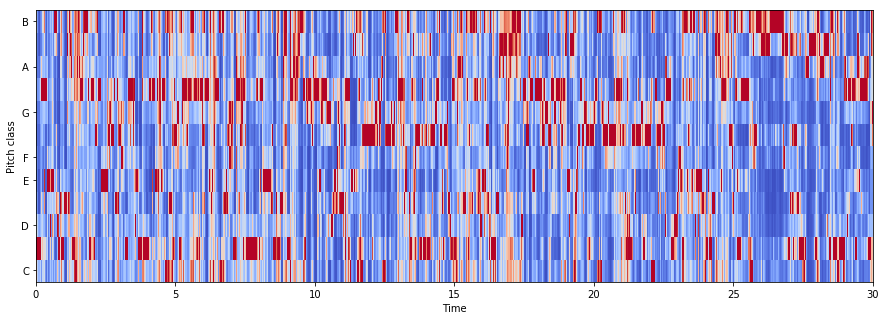

In [0]:
# Loadign the file
x, sr = librosa.load('disco.00018.au')

# find chromo frequencies values
hop_length = 600
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)

#create figure size
plt.figure(figsize=(15, 5))

#show chroma frequencies value
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

# Importing Libraries

In [4]:
# feature extractoring and preprocessing data
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
import pathlib
import csv

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

#Keras
import keras

import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


The dataset consists of 10 genres i.e
 * Blues
 * Classical
 * Country
 * Disco
 * Hiphop
 * Jazz
 * Metal
 * Pop
 * Reggae
 * Rock
 
 Each genre contains 100 songs. Total dataset: 1000 songs

## Extracting the Spectrogram for every Audio

Here, we are going to create spectrogram for every audio file and store into a different folder based on every category.

In [0]:
#color type for plot
cmap = plt.get_cmap('inferno')

# plot size
plt.figure(figsize=(10,10))

# label name
musics = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
for g in musics:
    #create a folder for each category label
    pathlib.Path(f'img_data/{g}').mkdir(parents=True, exist_ok=True)
    
    #access each label folder from music folder
    for filename in os.listdir(f'./music/{g}'):
        
        # access each audio file from each folder
        songname = f'./music/{g}/{filename}'
        
        #get time series value and sampling rate
        y, sr = librosa.load(songname, mono=True, duration=5)
        
        #create spectrogram for each audio file
        plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
        plt.axis('off');
        
        # save the spectrogram as a png file for each audio file
        plt.savefig(f'img_data/{g}/{filename[:-3].replace(".", "")}.png')
        
        #clear the current figure
        plt.clf()


All the audio files get converted into their respective spectrograms .WE can now easily extract features from them.

## Extracting features from Spectrogram


We will extract

* Mel-frequency cepstral coefficients (MFCC)(20 in number)
* Spectral Centroid,
* Zero Crossing Rate
* Chroma Frequencies
* Spectral Roll-off.

## Writing data to csv file

We write the data to a csv file 

In [0]:
# create columns name for csv file
header = 'filename chroma_stft rmse spectral_centroid spectral_bandwidth rolloff zero_crossing_rate'

#generate 20 mfcc label name 
for i in range(1, 21):
    header += f' mfcc{i}'
header += ' label'

#split string
header = header.split()

We are going to extract feature from every audio file and save it into csv file.

In [0]:
# create a csv file
file = open('data.csv', 'w', newline='')
with file:
    # create csv writer csv file object
    writer = csv.writer(file)
    # write header into csv file
    writer.writerow(header)
    
musics = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
for g in musics:
    # access each folder
    for filename in os.listdir(f'./music/{g}'):
        #access each audio file
        songname = f'./music/{g}/{filename}'
        #read each audio file
        y, sr = librosa.load(songname, mono=True, duration=30)
        
        # get chroma frequency values from each audio file
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        
        # get spectral centroid values from each audio file
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        
        # get spectral bandwidth values from each audio file
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        
        # get spectral rolloff values from each audio file
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        
        # get root-mean-square  values from each audio file
        rmse = librosa.feature.rmse(y=y)
        
        # get zero crossing rate values from each audio files
        zcr = librosa.feature.zero_crossing_rate(y)
        
        # get mfcc values from each audio file
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        
        #find mean value for every feature
        to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)}'
        
        #find mean value for every mfcc feature
        for e in mfcc:
            to_append += f' {np.mean(e)}'
        to_append += f' {g}'
        #open csv file
        file = open('data.csv', 'a', newline='')
        with file:
            # create csv writer csv file object
            writer = csv.writer(file)
            # write all feature value into the csv file
            writer.writerow(to_append.split())

# Analysing the Data in Pandas

In [11]:
#read data.csv file
data = pd.read_csv('data.csv')
data.head(10)

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,blues.00081.au,0.380260,0.248262,2116.942959,1956.611056,4196.107960,0.127272,-26.929785,107.334008,-46.809993,...,14.336612,-13.821769,7.562789,-6.181372,0.330165,-6.829571,0.965922,-7.570825,2.918987,blues
1,blues.00022.au,0.306451,0.113475,1156.070496,1497.668176,2170.053545,0.058613,-233.860772,136.170239,3.289490,...,-2.250578,3.959198,5.322555,0.812028,-1.107202,-4.556555,-2.436490,3.316913,-0.608485,blues
2,blues.00031.au,0.253487,0.151571,1331.073970,1973.643437,2900.174130,0.042967,-221.802549,110.843071,18.620984,...,-13.037723,-12.652228,-1.821905,-7.260097,-6.660252,-14.682694,-11.719264,-11.025216,-13.387260,blues
3,blues.00012.au,0.269320,0.119072,1361.045467,1567.804596,2739.625101,0.069124,-207.208080,132.799175,-15.438986,...,-0.613248,0.384877,2.605128,-5.188924,-9.527455,-9.244394,-2.848274,-1.418707,-5.932607,blues
4,blues.00056.au,0.391059,0.137728,1811.076084,2052.332563,3927.809582,0.075480,-145.434568,102.829023,-12.517677,...,7.457218,-10.470444,-2.360483,-6.783624,2.671134,-4.760879,-0.949005,0.024832,-2.005315,blues
5,blues.00058.au,0.356588,0.162028,2068.371125,2033.930047,4231.499413,0.104372,-95.436027,105.216700,-26.953012,...,10.262575,-9.438187,3.867535,-10.187453,3.588093,-3.100753,0.194597,0.842872,-3.416576,blues
6,blues.00066.au,0.374710,0.110496,2340.432873,2256.538115,4972.503265,0.121775,-116.517402,97.430279,-13.880191,...,10.998190,-13.861801,9.735367,-5.089488,2.634638,-9.883816,6.159059,-7.682608,-4.852479,blues
7,blues.00060.au,0.430894,0.196222,1946.565652,1979.909934,3955.867746,0.097454,-67.770980,111.704184,-34.646105,...,12.295832,-12.477988,1.681278,-5.142068,4.644002,-6.919217,1.040718,-4.736871,-0.660037,blues
8,blues.00025.au,0.290948,0.089222,1109.569627,1463.288131,2243.569767,0.051725,-249.281996,130.997924,0.665435,...,-3.575065,-2.926915,4.598686,7.478115,-0.178770,-2.818857,-2.667636,0.751667,-0.533179,blues
9,blues.00014.au,0.329163,0.066981,1172.065695,1705.817502,2344.952487,0.045046,-305.705187,113.060911,12.118723,...,1.298478,5.954478,8.543867,1.117664,0.591559,0.057474,-3.712342,-1.004448,-1.802434,blues


In [0]:
# Dropping unneccesary columns
data = data.drop(['filename'],axis=1)

## Encoding the Labels

In [0]:
# seperate label column only
genre_list = data.iloc[:, -1]

# convert category label to number 
encoder = LabelEncoder()
y = encoder.fit_transform(genre_list)

# Convert a class vector (integers) to binary class matrix.
from keras.utils import np_utils
y = np_utils.to_categorical(y)

In [14]:
y

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

## Scaling the Feature columns

In [0]:
# normalize input variables
scaler = StandardScaler()
X = scaler.fit_transform(np.array(data.iloc[:, :-1], dtype = float))

## Dividing data into training and Testing set

In [0]:
#split train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

## Convert input samples to 3 dimensions

In [0]:
# convert input samples to 3 dimensions because LSTM wants input like 3 dimensions
x_rnn_train  = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
x_rnn_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

## Create model architecture

In [18]:
from keras.layers import Dense , Input , LSTM , Dropout 
from keras.layers import Bidirectional
from keras.models import Model, Sequential


model = Sequential()
model.add(Bidirectional(LSTM(32, input_shape=(x_rnn_train.shape[1], x_rnn_train.shape[2]))))
model.add(Dense(30, activation="relu"))
model.add(Dropout(0.05))
model.add(Dense(10, activation="softmax"))

# compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# train the model
batch_size = 100
epochs = 400
model.fit(x_rnn_train,y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 640 samples, validate on 160 samples
Epoch 1/400
640/640 [==============================] - 1s 2ms/step - loss: 2.2786 - acc: 0.1328 - val_loss: 2.2451 - val_acc: 0.2750
Epoch 2/400
640/640 [==============================] - 0s 57us/step - loss: 2.2245 - acc: 0.2766 - val_loss: 2.1949 - val_acc: 0.3187
Epoch 3/400
640/640 [==============================] - 0s 55us/step - loss: 2.1749 - acc: 0.3234 - val_loss: 2.1450 - val_acc: 0.3438
Epoch 4/400
640/640 [==============================] - 0s 56us/step - loss: 2.1212 - acc: 0.3438 - val_loss: 2.0912 - val_acc: 0.3313
Epoch 5/400
640/640 [==============================] - 0s 57us/step - loss: 2.0694 - acc: 0.3453 - val_loss: 2.0330 - val_acc: 0.3125
Epoch 6/400
640/640 [=============================

## Evaluate the model

In [21]:
target_name = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
print(model.metrics_names)
#evalute the model on training dataset
print(model.evaluate(x_rnn_train, y_train))

#evalute the model on test dataset
print(model.evaluate(x_rnn_test, y_test))

#prediction on training dataset by the model
train_preds = model.predict_classes(x_rnn_train)

#prediction on test dataset by the model
test_preds = model.predict_classes(x_rnn_test)


#create classification report tabel
target_names = target_name
pd.DataFrame(classification_report(y_pred=test_preds,
                      y_true=y_test.argmax(axis=1),
                      target_names = target_names,
                     output_dict = True
                     ))

['loss', 'acc']
800/800 [==============================] - 0s 38us/step
[0.4598628341872245, 0.9325]
200/200 [==============================] - 0s 57us/step
[2.1475257301330566, 0.66]


,blues,classical,country,disco,hiphop,jazz,macro avg,metal,micro avg,pop,reggae,rock,weighted avg
f1-score,0.73913,0.962963,0.577778,0.439024,0.594595,0.789474,0.671555,0.864865,0.66,0.782609,0.465116,0.500000,0.663488
precision,0.73913,1.000000,0.520000,0.428571,0.550000,0.833333,0.678821,0.888889,0.66,0.818182,0.454545,0.555556,0.671405
recall,0.73913,0.928571,0.650000,0.450000,0.647059,0.750000,0.668760,0.842105,0.66,0.750000,0.476190,0.454545,0.660000
support,23.00000,14.000000,20.000000,20.000000,17.000000,20.000000,200.000000,19.000000,200.00,24.000000,21.000000,22.000000,200.000000


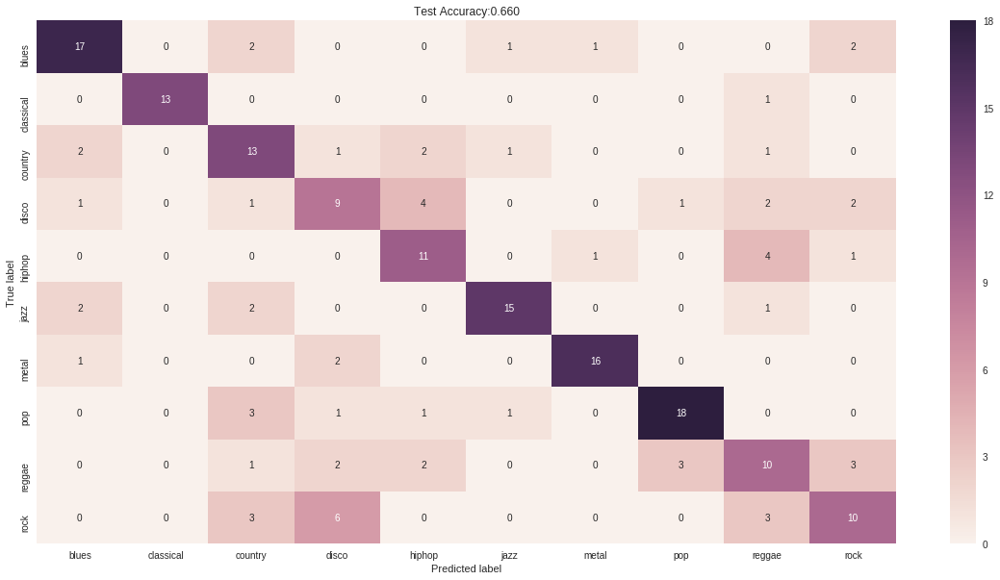

In [29]:

# Creates a confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), test_preds)

# Transform to df for easier plotting
cm_df = pd.DataFrame(cm,
                     index = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'], 
                     columns = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'])

#figure size
plt.figure(figsize=(20,10))

#create heatmap using seaborn
sns.heatmap(cm_df, annot=True)
#print accuracy as a title of table
plt.title('Test Accuracy:{0:.3f}'.format(accuracy_score(y_test.argmax(axis=1), test_preds)))

#y axies label
plt.ylabel('True label')

#x axies label
plt.xlabel('Predicted label')

#show the figure
plt.show()

## Predictions on Test Data

In [0]:
predictions = model.predict(x_rnn_test)

In [24]:
predictions[2].shape

(10,)

In [25]:
np.sum(predictions[2])

1.0

In [26]:
np.argmax(predictions[2])


3